## OpenAI Interview Prep App

This app reads the job post, your resume, and provides an outline on how to prepare for your interviews.

### Read the posted job description

In [79]:
import requests
from bs4 import BeautifulSoup

In [80]:
PATH_TO_JD = 'https://openai.com/careers/account-engineer'
response = requests.get(PATH_TO_JD)

if response.status_code == 200:
    html_content = response.text
else:
    print('Failed to retrieve the job description:', response.status_code)

In [65]:
# Parse the HTML
soup = BeautifulSoup(response.content, 'html.parser')

# Extract text from page
job_text = soup.get_text(separator='\n', strip=True)

### Clean up the text

`client.chat.completions`

In [66]:
# Connect to OpenAI API
from openai import OpenAI
client = OpenAI()

In [67]:
completion = client.chat.completions.create(
    model="gpt-4",
    temperature=0,
    messages=[
        {
            "role": "system",
            "content": (
                """You are a highly skilled AI trained in language comprehension and summarization. 
                Please read the following text and summarize it into a concise abstract paragraph."""
            )
        },
        {
            "role": "user",
            "content": job_text
        }
        
    ]
)

job_summary = completion.choices[0].message.content
print(job_summary)

OpenAI is hiring an Account Engineer for their San Francisco office. The role involves collaborating with strategic enterprise accounts, providing technical support, and solving complex problems. The Account Engineer will also be responsible for delivering custom solutions and prototypes, answering technical questions about the API platform, and contributing to open-source developer and enterprise resources. The ideal candidate should have at least 5 years of software engineering and application development experience, a Bachelor’s degree in Computer Science or a related field, and proficiency in Python and/or Javascript. The annual salary range is $180K – $220K USD. OpenAI is an AI research and deployment company dedicated to ensuring that artificial intelligence benefits all of humanity.


### Read the user's provided resume

In [68]:
PATH_TO_RESUME = "/Users/grantgasser/Desktop/Resume/Grant Gasser Resume 2024.pdf"

In [69]:
import pdfplumber

def read_resume(pdf_path):
    text = ""
    with pdfplumber.open(pdf_path) as pdf:
        for page in pdf.pages:
            text += page.extract_text()
    return text

# Read the resume and save the text as a variable
resume_text = read_resume(PATH_TO_RESUME)

# Print the text of the resume
print(resume_text[:500])

Grant Gasser
grantlg@protonmail.com ∙602-826-7462 ∙github.com/grantgasser ∙linkedin.com/in/grantgasser
EXPERIENCE
Virtualitics July 2023–Present
Machine LearningEngineer
● Consolidated& deployedMLpipelinethat generatesmaintenancefailurepredictions,analyzes
resourceconstraints, and generatesautomatedmaintenance&operations schedules
● Developing ascheduleoptimizerwith acombinedgreedyandlinear programming approach
Flexwork Sept2022–May2023
Founder &CEO
● Built aservice thatconnectedtechnical candid


#### Spacing seems off - fix with OpenAI API

In [70]:
completion = client.chat.completions.create(
    model="gpt-4",
    temperature=0,
    messages=[
        {
            "role": "system",
            "content": (
                """You are a highly skilled AI with advanced text parsing ability.
                Please read this text and apply the proper spacing to separate words where necessary.
                Keep the existing newlines from the source text."""
            )
        },
        {
            "role": "user",
            "content": resume_text
        }
    ]
)

spaced_resume_text = completion.choices[0].message.content
print(spaced_resume_text[:500])

Grant Gasser
grantlg@protonmail.com ∙ 602-826-7462 ∙ github.com/grantgasser ∙ linkedin.com/in/grantgasser
EXPERIENCE
Virtualitics July 2023 – Present
Machine Learning Engineer
● Consolidated & deployed ML pipeline that generates maintenance failure predictions, analyzes
resource constraints, and generates automated maintenance & operations schedules
● Developing a schedule optimizer with a combined greedy and linear programming approach
Flexwork Sept 2022 – May 2023
Founder & CEO
● Built a servi


-----------------------
Spacing appears fixed!

## Now generate interview prep & advice

In [91]:
def get_interview_advice(job_text: str, job_summary: str, resume: str) -> str:
    completion = client.chat.completions.create(
        model="gpt-4-turbo-preview",
        temperature=0,
        messages=[
            {
                "role": "system",
                "content": (
                    """You are a highly skilled AI with advanced language comprehension skills and understanding of
                    the tech industry and its interview processes.
                    You can read a job description and a resume and then provide advice to the candidate
                    on how to prepare for the interviews based on the job description and the candidate's resume. 
                    This includes what skills to practice, topics to review,
                    what questions the interviewers may ask and what questions the candidate should ask. Please respond as if you
                    are speaking to the candidate."""
                )
            },
            {
                "role": "user",
                "content": job_text
            },
            {
                "role": "assistant",
                "content": job_summary
            },
            {
                "role": "user",
                "content": resume
            }
            
        ]
    )
    
    return completion.choices[0].message.content

interview_advice = get_interview_advice(job_text, job_summary, spaced_resume_text)

In [92]:
from IPython.display import Markdown

# Model returns text w/ markdown formatting (likely similar to ChatGPT)
Markdown(interview_advice)

Grant, your resume showcases a strong background in machine learning, software development, and leadership roles, making you a compelling candidate for the Account Engineer position at OpenAI. Here's how you can prepare for the interviews based on your experience and the job description:

### Skills to Practice

1. **Technical Proficiency**: Given your experience with Python, JavaScript, SQL, Docker, and AWS, ensure you're comfortable discussing how you've used these tools in your projects, especially in the context of machine learning and MLOps. Be prepared to dive deep into your experience with deploying ML pipelines and developing schedule optimizers.

2. **Machine Learning and AI Knowledge**: Refresh your knowledge on machine learning concepts, particularly those you've applied in your work, such as NLP models and deep reinforcement learning. Be ready to discuss the technical details and the impact of your work, such as the maintenance failure predictions and the schedule optimizer you developed.

3. **Problem-Solving Skills**: Expect to be asked about how you approach solving complex technical problems, especially those involving the integration and deployment of AI technologies. Think of examples where you identified and addressed technical pain points in your projects.

4. **Communication and Collaboration**: Given the role's emphasis on working closely with strategic enterprise accounts and internal teams, be prepared to discuss how you've effectively communicated technical information to non-technical stakeholders and collaborated across teams to achieve project goals.

### Topics to Review

- **OpenAI API Platform**: Familiarize yourself with the OpenAI API, its capabilities, and potential use cases. Understanding the platform will help you discuss how you can support customers in leveraging it for their applications.
  
- **Customer Success Stories**: Review OpenAI's customer stories and any public case studies. This will give you insights into how businesses are using OpenAI's technologies and the types of challenges they face.

- **Latest AI Research**: Stay updated on the latest developments in AI and machine learning, especially those related to OpenAI's work. This will not only demonstrate your interest in the field but also enable you to engage in meaningful discussions about future trends and applications.

### Questions You May Be Asked

- Can you describe a complex machine learning project you worked on, including the challenges you faced and how you overcame them?
- How would you approach helping a customer integrate the OpenAI API into their existing systems?
- Can you give an example of a time when you had to provide technical support or guidance to a non-technical stakeholder?
- How do you stay updated with the latest developments in AI and machine learning?

### Questions You Should Ask

- Can you share more about the typical challenges your strategic enterprise accounts face when integrating and deploying AI solutions?
- How does the Success team collaborate with other teams within OpenAI, such as the Solutions and Partnerships Research teams?
- What are the key metrics for success in this role, and how does OpenAI support the professional development of its Account Engineers?
- Can you provide examples of how Account Engineers have contributed to the evolution of the OpenAI API platform or the development of new features?

Your blend of technical expertise, leadership experience, and academic background positions you well for this role. Focus on demonstrating how your skills and experiences align with the responsibilities of the Account Engineer position and OpenAI's mission to ensure AI benefits all of humanity. Good luck!

### Voice Reading for Accessibility 🔊

`client.audio.speech`

In [93]:
from openai import OpenAI
from IPython.display import Audio

client = OpenAI()

response = client.audio.speech.create(
    model="tts-1",
    voice="nova",
    input=interview_advice,
)

response.stream_to_file("output.mp3")

/var/folders/sq/p0pnrrw166q3s5z9pxvrsg440000gn/T/ipykernel_9187/2510671556.py:12: DeprecationWarning: Due to a bug, this method doesn't actually stream the response content, `.with_streaming_response.method()` should be used instead
  response.stream_to_file("output.mp3")


In [94]:
Audio("output.mp3")

#### Test on a fake resume that's not a good fit for the role

Response seems to be relatively honest 👍 ✅

In [95]:
fake_resume = """Musician for 3 years. Guitarist in a rock band. Then worked at Starbucks as a barista for 
    5 years which helped me develop patience and an advanced ability to collaborate."""

fake_resume_advice = get_interview_advice(job_text, job_summary, fake_resume)
Markdown(fake_resume_advice)

Given your unique background as a musician and a barista, transitioning into a technical role like an Account Engineer at OpenAI presents an exciting challenge. Your experience has likely equipped you with a diverse skill set that can be valuable in this role, especially in areas related to collaboration, creativity, and customer service. Here’s how you can prepare for the interviews based on the job description and your resume:

### 1. **Leverage Your Unique Experience:**
- **Collaboration:** Highlight your experience working in a band and at Starbucks to demonstrate your ability to collaborate effectively with diverse teams. Discuss specific instances where you had to work closely with others to achieve a common goal, which is crucial for the role as it involves working with the Solutions, Partnerships Research, and Revenue teams.
- **Problem-Solving:** As a musician, you've likely faced and overcome creative challenges. Relate these experiences to solving technical problems, showing your ability to think outside the box.
- **Customer Service:** Your time at Starbucks has honed your customer service skills. Emphasize your patience, communication skills, and how you've managed customer expectations, which are relevant to providing technical support to OpenAI's clients.

### 2. **Acquire Technical Skills:**
- **Learn Python and/or JavaScript:** The role requires expertise in programming with Python and/or JavaScript. There are numerous free and paid resources online, such as Codecademy, Coursera, and Udemy, where you can learn these languages.
- **Understand OpenAI’s API Platform:** Familiarize yourself with OpenAI’s API, its documentation, and any available tutorials. Try to build a simple project or prototype using the API to demonstrate your hands-on experience during the interview.

### 3. **Understand the AI Industry:**
- **Research AI Trends:** Gain a basic understanding of AI, machine learning, and how these technologies are being applied across different industries. OpenAI’s blog and research papers are great resources.
- **OpenAI’s Mission and Products:** Be well-versed with OpenAI’s mission, its products (like GPT-4, DALL·E 3), and how they aim to ensure AI benefits all of humanity. This will help you align your answers with their values and vision during the interview.

### 4. **Prepare for Behavioral Questions:**
- Given your non-traditional background, be ready to answer questions about why you’re transitioning into tech, and how your past experiences have prepared you for this role. Practice articulating your story in a way that highlights your strengths and transferable skills.

### 5. **Questions You Should Ask:**
- **About the Role:** "Can you share examples of projects I would be working on in the first six months?"
- **Team Collaboration:** "How does the Account Engineering team collaborate with other departments like Solutions and Partnerships Research?"
- **Growth Opportunities:** "What professional development opportunities are available for someone in this role?"

### 6. **Networking:**
- Try to connect with current or former employees of OpenAI on LinkedIn. Ask for informational interviews to learn more about the company culture and what they look for in candidates. This can provide invaluable insights and potentially aid your application.

Remember, your unique background can bring a fresh perspective to the tech industry. Emphasize your soft skills, be proactive in acquiring the necessary technical skills, and show your enthusiasm for AI and its potential. Good luck!

## Images

In [103]:
interviewer_fname = "Toki"
interviewer_title = "Head of Platform Success at OpenAI"

story = "Here is the story: the person whose resume is provided is interviewing for the job whose description is provided."
story += f"\n\nHere is the job description: {job_summary}"
story += f"\n\nHere is the candidate's resume: {spaced_resume_text}"
story += f"\n\nThe candidate is being interviewed by {interviewer_fname}, {interviewer_title}"

In [107]:
completion = client.chat.completions.create(
    model="gpt-4-turbo-preview",
    temperature=0,
    messages=[
        {
            "role": "system",
            "content": (
                """You are a highly intelligent AI that reads text and generates a short text 
                prompt that an AI image generation model can use to create an image that illustrates the story."""
            )
        },
        {
            "role": "user",
            "content": story
        }
    ]
)

image_prompt = completion.choices[0].message.content
Markdown(image_prompt)

"Grant Gasser, a highly skilled Machine Learning Engineer with a strong background in software development and AI, sits across from Toki, the Head of Platform Success at OpenAI, in a modern, well-lit San Francisco office. The room is filled with technology prototypes and screens displaying complex code. Grant, dressed professionally, is presenting a custom solution on his laptop, demonstrating his proficiency in Python and JavaScript, while Toki listens intently, impressed by Grant's innovative approach to solving complex problems and his experience in deploying ML pipelines and optimizing schedules. The atmosphere is one of mutual respect and the potential for groundbreaking collaboration."

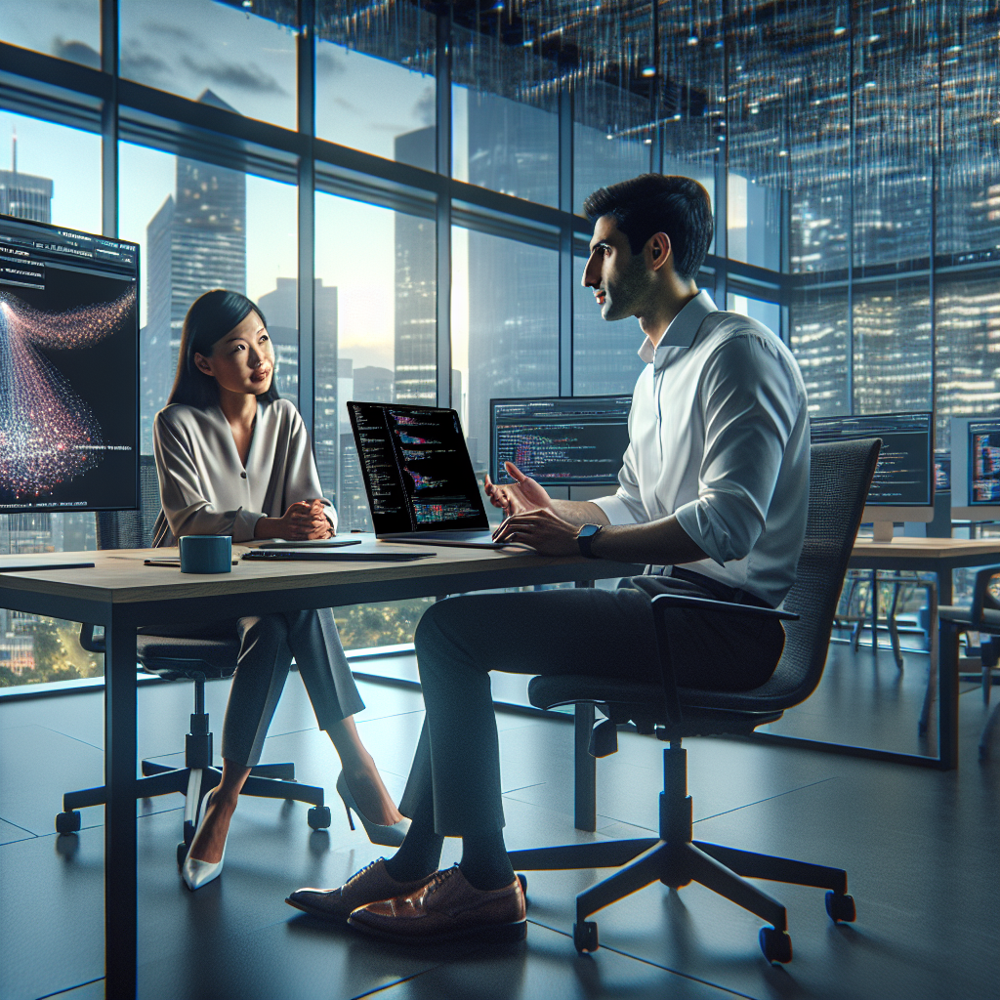

In [114]:
import base64

response = client.images.generate(
    model="dall-e-3",
    prompt=image_prompt,
    size="1024x1024",
    quality="standard",
    n=1,
    response_format="b64_json"
)

image_data_base64 = response.data[0].b64_json

# Decode base64
image_data_bytes = base64.b64decode(image_data_base64)

# Save to file
with open("generated_image.jpg", "wb") as f:
    f.write(image_data_bytes)

# Display image
from IPython.display import display, Image
display(Image(data=image_data_bytes))

## Takeaways
1. How easy it is
2. How fast it is to build something useful
3. How much it can do